# Configuración del entorno

In [ ]:
import os
import warnings

warnings.filterwarnings("ignore")

IN_COLAB = "COLAB_GPU" in os.environ

if IN_COLAB:
    BASE_PATH = "."
    OUTPUT_PATH = "."
else:
    BASE_PATH = "../data"
    OUTPUT_PATH = "../outputs"

print(f"Entorno Colab: {IN_COLAB}")
print(f"BASE_PATH: {BASE_PATH}")
print(f"OUTPUT_PATH: {OUTPUT_PATH}")

Entorno Colab: True
BASE_PATH: .
OUTPUT_PATH: .


# Instalación e importado de bibliotecas

In [ ]:
#import de las librerias
import pandas as pd
import numpy as np

from pandas.api.types import CategoricalDtype

try:
    from ydata_profiling import ProfileReport
except ImportError:
    import sys

    print("Instalando dependencias necesarias...")

    # 1. asegurar setuptools compatible
    !{sys.executable} -m pip install "setuptools<82"

    # 2. instalar profiling
    !{sys.executable} -m pip install ydata-profiling

    from ydata_profiling import ProfileReport


# Dataset de encuesta de turismo en Argentina


# Fase 1: Comprensión del Negocio

## Objetivos

Este proyecto busca **clasificar el gasto de los turistas** para predecirlo en función de las características de su viaje. Para ello, se abordan dos objetivos clave:

1. **Clasificación del gasto:** Predecir el gasto de los turistas en función de los atributos del viaje, utilizando límites de gasto definidos en categorías.
1. **Identificación de características clave:** Determinar qué características del viaje tienen mayor impacto en el gasto de los turistas.

## Evaluación de la Situación

El proyecto se basa en los datos de la **Encuesta de Viajes y Turismo de los Hogares (EVyTH)**, un conjunto de datos provisto por el **Ministerio de Turismo y Deportes de la República Argentina**. Estos datos provienen de encuestas telefónicas, que tienen la particularidad de contar con valores faltantes y, en algunos casos, datos erróneos. A pesar de estas limitaciones, son los únicos datos disponibles y se utilizan como base para el análisis.


## Costos y Beneficios

El proyecto no implica costos adicionales, ya que los datos son públicos. Los beneficios potenciales son significativos, ya que permitirán al **Ministerio de Turismo** tomar decisiones más informadas y mejorar las estrategias de marketing y planificación, lo que podría generar importantes beneficios económicos a largo plazo.

## Objetivo del Notebook 1: Fases 2 y 3 - Preparación y Comprensión de los Datos

Este notebook se centra en las **fases 2 y 3** del proyecto, que incluyen:

**Fase 2: Comprensión de los Datos**
- **Recolección de datos iniciales:** Se cargan y exploran los datos iniciales de la encuesta.
- **Descripción de los datos:** Se realiza una descripción de las principales variables del conjunto de datos.
- **Exploración y verificación de la calidad de los datos:** Se verifica la calidad de los datos, identificando valores faltantes, inconsistencias y posibles errores.

**Fase 3: Preparación de los Datos**
- **Limpieza de datos:** Se manejan los valores faltantes, se corrigen o eliminan registros inconsistentes, y se transforman variables si es necesario.
- **Estructuración de los datos:** Se derivan nuevos atributos y se reduce la cantidad de valores posibles de ciertos atributos para mejorar la calidad del modelo.
- **Selección de datos:** Se definen qué atributos y registros se utilizarán en el análisis, excluyendo aquellos que no sean relevantes.
- **Integración de datos:** Se realizan operaciones de agregación y transformación para integrar adecuadamente los datos.
- **Estructuración final:** Se lleva a cabo una reducción de la cantidad de valores posibles de los atributos y transformaciones adicionales en la variable objetivo del gasto.

El objetivo principal de este notebook es preparar el conjunto de datos para su uso en el modelado posterior. Las técnicas de limpieza y transformación de los datos son fundamentales para garantizar la calidad de los resultados del modelo.

## Objetivo del Notebook 2: Fase 4 - Modelado con Algoritmos de Clasificación

En este segundo notebook, nos enfocamos en la **fase 4**, que implica el **modelado** de los datos utilizando algoritmos de clasificación. Las actividades clave en esta fase incluyen:

- **Identificación de atributos importantes:** Uso de diversos métodos para seleccionar las características que tienen mayor impacto en la predicción del gasto de los turistas.
- **Entrenamiento del modelo Hoeffding Tree:** Utilización de los atributos seleccionados para entrenar un Hoeffding Tree en el conjunto de datos procesado.
- **Evaluación del modelo:** Evaluación del rendimiento del modelo utilizando métricas como accuracy, precision, recall y la confusion matrix, con el objetivo de predecir de manera precisa el gasto de los turistas.

El objetivo principal de este notebook es construir y evaluar modelos predictivos que nos permitan predecir el gasto de los turistas en función de los atributos de su viaje.

# Fase 2: Comprensión de los datos

## Tarea: Recolección de datos iniciales

**Recolección del set de datos**

In [ ]:
#creo el dataframe a partir del set de datos
#url_dataset = f"http://datos.yvera.gob.ar/dataset/b5819e9b-5edf-4aad-bd39-a81158a2b3f3/resource/645e5505-68ee-4cfa-90f9-fcc9a4a34a85/download/evyth_2019_2021t1.csv"
url_dataset = f'{BASE_PATH}/evyth_2019_2021t1.csv'
print(f"link del dataset: {url_dataset}")
df = pd.read_csv(url_dataset)

link del dataset: ./evyth_2019_2021t1.csv


In [ ]:
df.shape

(63289, 88)

**Recolección del diccionario de datos**


Se utiliza el diccionario para interpretar correctamente las variables del dataset.

In [ ]:
#creo el dataframe a partir del diccionario de datos
url_diccionario = f"{BASE_PATH}/evyth_diccionario_registro.txt"
print(f"link del diccionario de datos: {url_diccionario}")
diccionario = pd.read_csv(url_diccionario,escapechar="\\")

link del diccionario de datos: ./evyth_diccionario_registro.txt


In [ ]:
print(f"diccionario de datos (incluye NaN - filas:{diccionario.shape[0]})")
diccionario.head(10)

diccionario de datos (incluye NaN - filas:481)


,variable,opcion,descripcion
0,id_hogar,NaN,Código de identificación único de hogares
1,id_viajes,NaN,Código de identificación único de viajes
2,miembro,NaN,Número de miembro en el hogar
3,anio,NaN,Año
4,trimestre,NaN,Trimestre
5,region_origen,NaN,Región de residencia del hogar
6,region_origen,1.0,Ciudad de Buenos Aires
7,region_origen,2.0,Provincia de Buenos Aires - Partidos del GBA
8,region_origen,3.0,Provincia de Buenos Aires - Resto
9,region_origen,4.0,Centro


**Elimino del diccionario de registros el atributo cod_loc_observaciones (ya que no se encuentra en el set de datos)**

In [ ]:
#elimino la fila correspondiente a cod_loc_observaciones
#(ya que este atributo no se encuentra en el set de datos a pesar de estar en el diccionario)
(diccionario['variable']=='cod_loc_observaciones').head(92)
diccionario.loc[(diccionario['variable']=='cod_loc_observaciones'),:].index
diccionario=diccionario.drop(diccionario.loc[(diccionario['variable']=='cod_loc_observaciones'),:].index)
diccionario.head()

,variable,opcion,descripcion
0,id_hogar,NaN,Código de identificación único de hogares
1,id_viajes,NaN,Código de identificación único de viajes
2,miembro,NaN,Número de miembro en el hogar
3,anio,NaN,Año
4,trimestre,NaN,Trimestre


**Transformación de las respuestas numéricas a su correspondiente significado en el set de datos**

In [ ]:
#transformo en el dataframe del set de datos aquellas columnas con numeros que en ralidad son categoricas a columnas con palabras
for indice,fila in diccionario.iterrows():
  if not pd.isna(fila['opcion']):
     #if fila['Atributo']!='cod_loc_observaciones':
     df[fila['variable']]=  df[fila['variable']].replace(to_replace=fila['opcion'],value=fila['descripcion'])
df.loc[:, ["px08"]]  = df.loc[:, ["px08"]].replace(0,"opcion desconocida")
df.loc[:, ["px08_agrup"]]  = df.loc[:, ["px08_agrup"]].replace(0,"opcion desconocida")

In [ ]:
df.head()

,id_hogar,id_viajes,miembro,anio,trimestre,region_origen,aglomerado_origen,region_destino,provincia_destino,localidad_destino,...,p006,p006_agrup,p007,nivel_ed,cond_act,p013,j_sexo,j_edad,j_nivel_ed,j_cond_act
0,230886,61201,1,2019,1,Cuyo,Gran Mendoza,Provincia de Buenos Aires - Resto,Buenos Aires (Resto),Sierra de la Ventana,...,54,45 a 59 años,No,Universitario completo,Ocupado,"Prepaga, mutual o servicio de emergencias medicas",Varón,45 a 59 años,Superior completa o más,Ocupado
1,230886,61201,2,2019,1,Cuyo,Gran Mendoza,Provincia de Buenos Aires - Resto,Buenos Aires (Resto),Sierra de la Ventana,...,43,30 a 44 años,No,Secundario completo,Inactivo,"Prepaga, mutual o servicio de emergencias medicas",Varón,45 a 59 años,Superior completa o más,Ocupado
2,230886,61201,3,2019,1,Cuyo,Gran Mendoza,Provincia de Buenos Aires - Resto,Buenos Aires (Resto),Sierra de la Ventana,...,25,14 a 29 años,Si,Terciario incompleto,Ocupado,"Prepaga, mutual o servicio de emergencias medicas",Varón,45 a 59 años,Superior completa o más,Ocupado
3,230886,61201,4,2019,1,Cuyo,Gran Mendoza,Provincia de Buenos Aires - Resto,Buenos Aires (Resto),Sierra de la Ventana,...,22,14 a 29 años,Si,Universitario incompleto,Inactivo,"Prepaga, mutual o servicio de emergencias medicas",Varón,45 a 59 años,Superior completa o más,Ocupado
4,230886,61201,5,2019,1,Cuyo,Gran Mendoza,Provincia de Buenos Aires - Resto,Buenos Aires (Resto),Sierra de la Ventana,...,25,14 a 29 años,Si,Universitario incompleto,Ocupado,"Prepaga, mutual o servicio de emergencias medicas",Varón,45 a 59 años,Superior completa o más,Ocupado


## Tarea: Descripción de los datos

**Renombrado de las columnas identificadas por número por un identificador más claro**

Se convierten variables codificadas en valores categóricos interpretables para facilitar el análisis.

In [ ]:
#para la etapa de descripción de datos sería deseable
#renombrar todas las columnas identificadas por numero
#por un identificador que sea más claro

#construyo el diccionario con las columnas en el orden
#en el que aparecen en los datos para que nos sea mas fácil
#chequear con el diccionario de registro

atributos_a_renombrar = {

                     'px06': 'cantidad_visitantes',
                     'px06_agrup': 'cantidad_visitantes_agrup',

                     'px07_agrup':'cantidad_noches_agrup',
                     'px07': 'cantidad_noches',

                     'px08':'tipo_alojamiento',
                     'px08_agrup':'tipo_alojamiento_agrup',

                     'px09': 'medio_transporte',

                     'px10_1': 'motivo_viaje',

                     'px11': 'paquete_turistico',
                     'px12_1': 'paquete_turistico_transporte',
                     'px12_2': 'paquete_turistico_alojamiento',
                     'px12_3': 'paquete_turistico_comidas_algunas',
                     'px12_4': 'paquete_turistico_comidas_todas',
                     'px12_5': 'paquete_turistico_alquiler_auto',
                     'px12_6': 'paquete_turistico_recreacion',
                     'px12_7': 'paquete_turistico_seguro_salud',
                     'px12_8': 'paquete_turistico_otros',

                     'px13' : 'tiempo_anticipacion_decision_viajar',

                     'px14' : 'contrata_servicios_x_internet',

                     'px15_1' : 'contrata_paquete_x_internet',
                     'px15_2' : 'contrata_alojamiento_x_internet',
                     'px15_3' : 'contrata_transporte_x_internet',
                     'px15_4' : 'contrata_recreacion_x_internet',

                     'pxb16_1_1' : 'motivo_la_naturaleza',
                     'pxb16_1_2' : 'motivo_la_historia_cultura',
                     'pxb16_1_3' : 'motivo_la_cercania',
                     'pxb16_1_4' : 'motivo_los_precios',
                     'pxb16_1_5' : 'motivo_los_comentarios',
                     'pxb16_1_6' : 'motivo_que_residen_familiares',
                     'pxb16_1_7' : 'motivo_publicidad',
                     'pxb16_1_9' : 'se_evaluo_viajar_a_otro_destino',

                     'pxb16_2' : 'ya_visito_el_lugar_y_cuando',

                     'px17_1' : 'actividad',
                     'px17_2_1' : 'actividad_rural',
                     'px17_2_2' : 'actividad_spa_y_termas',
                     'px17_2_3' : 'actividad_de_playa',
                     'px17_2_4' : 'actividad_deporte_de_nieve',
                     'px17_2_5' : 'actividad_deporte_de_aventura',
                     'px17_2_6' : 'actividad_caza_y_pesca',
                     'px17_2_7' : 'actividad_espectaculo_deportivo',
                     'px17_2_8' : 'actividad_religiosa',
                     'px17_2_9' : 'actividad_cultural',
                     'px17_2_10' : 'actividad_museos_y_zoo',
                     'px17_2_11' : 'actividad_ecologica',
                     'px17_2_12' : 'actividad_casino_y_bingo',
                     'px17_2_13' : 'actividad_salida_nocturna',

                     'px18_1' : 'calificacion',
                     'px18_2' : 'calificacion_alojamiento',
                     'px18_3' : 'calificacion_gastronomia',
                     'px18_4' : 'calificacion_info_turistica',
                     'px18_5' : 'calificacion_higiene',
                     'px18_6' : 'calificacion_seguridad',
                     'px18_7' : 'calificacion_en_general',

                     'p002': 'cantidad_miembros',
                     'p004': 'parentezco_j_hogar',
                     'p005': 'sexo',
                     'p006': 'edad',
                     'p006_agrup': 'edad_agrup',
                     'p007' : 'es_estudiante',
                     'p013': 'cobertura_salud'
                     }
df1=df.rename(columns=atributos_a_renombrar)
diccionario2=diccionario.replace(atributos_a_renombrar)

**Generación del Reporte de Descripción de los Datos**


Se renombra el dataset para mejorar la legibilidad de los atributos y facilitar el análisis posterior.

In [ ]:
#renombro columnas del dataframe diccionario
diccionario2=diccionario2.rename(columns={'index':'#','variable':'Atributo','opcion':'Valores posibles','descripcion':'Descripción'})
#diccionario2=diccionario.astype(str)

#agrego las columnas # y Tipo al dataframe diccionario
diccionario2.insert(0,'#','')
diccionario2.insert(2,'Tipo','')
diccionario2.head(10)

,#,Atributo,Tipo,Valores posibles,Descripción
0,,id_hogar,,NaN,Código de identificación único de hogares
1,,id_viajes,,NaN,Código de identificación único de viajes
2,,miembro,,NaN,Número de miembro en el hogar
3,,anio,,NaN,Año
4,,trimestre,,NaN,Trimestre
5,,region_origen,,NaN,Región de residencia del hogar
6,,region_origen,,1.0,Ciudad de Buenos Aires
7,,region_origen,,2.0,Provincia de Buenos Aires - Partidos del GBA
8,,region_origen,,3.0,Provincia de Buenos Aires - Resto
9,,region_origen,,4.0,Centro


In [ ]:
#realizo las transformaciones y reacomodamientos de datos necesarios para obtener una tabla con la descripción de los datos

#diccionario2 = diccionario.copy()
numero_atributo=0
for indice,fila in diccionario2.iterrows():
   #print(fila)
   #print(fila.opcion)
   #print(indice)
   #print(fila['Atributo'])
   if pd.isna(fila['Valores posibles']):
      #diccionario2.iloc[indice,:]=  diccionario.iloc[indice,:].replace(to_replace=fila['Valores posibles'],value='')
      diccionario2.loc[indice,['Valores posibles']]=''
      numero_atributo=numero_atributo+1
      diccionario2.loc[indice,['#']]=numero_atributo
      #if fila['Atributo']!='cod_loc_observaciones':
      if df1[fila['Atributo']].dtypes=='object':
         diccionario2.loc[indice,['Tipo']]='Categórico'
      else:
         diccionario2.loc[indice,['Tipo']]='Numérico'
      #diccionario2.loc[indice,['Tipo']]=df[fila['Atributo']].dtypes
   else:
      diccionario2.loc[indice,['Valores posibles']]=fila['Descripción']
      diccionario2.loc[indice,['Atributo','Descripción']]=''
      #diccionario2.iloc[indice,:]=  diccionario.iloc[indice,:].replace(to_replace=fila['Valores posibles'],value=fila['Descripción'])
      #diccionario2.iloc[indice,:]=  diccionario.iloc[indice,:].replace(to_replace=fila['Descripción'],value='')

#diccionario2.head(10)


In [ ]:
#termino de reacomodar los datos
#(en este caso en particular realizo un corrimiento hacia arriba de la columna de valores posibles,
#para corregir espacios en blanco productos de las transformaciones anteriores)
diccionario2['Valores posibles'] = diccionario2['Valores posibles'].shift(-1)
diccionario2.shape

(480, 5)

In [ ]:
from IPython.display import display

print("Reporte de Descripción de los Datos:")
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', None)
display(diccionario2)

Reporte de Descripción de los Datos:


,#,Atributo,Tipo,Valores posibles,Descripción
0,1,id_hogar,Numérico,,Código de identificación único de hogares
1,2,id_viajes,Numérico,,Código de identificación único de viajes
2,3,miembro,Numérico,,Número de miembro en el hogar
3,4,anio,Numérico,,Año
4,5,trimestre,Numérico,,Trimestre
5,6,region_origen,Categórico,Ciudad de Buenos Aires,Región de residencia del hogar
6,,,,Provincia de Buenos Aires - Partidos del GBA,
7,,,,Provincia de Buenos Aires - Resto,
8,,,,Centro,
9,,,,Litoral,


In [ ]:
#diccionario2.to_csv(f'{BASE_PATH}/tabla de atributos2.csv',index=False)

## Tarea: Exploración y verificación de la calidad de los datos

**Exploración y verificación de todos los datos**

Se realiza una exploración inicial automática del dataset para identificar estructura, tipos de variables y calidad de datos.

In [ ]:
#genero el informe del dataframe
reporte=ProfileReport(df1,minimal=True,title="Reporte de Exploración de datos")#Descripción inicial de datos")
#reporte.to_notebook_iframe()
reporte.to_file(f"{OUTPUT_PATH}/Reporte de Exploracion de datos.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 88/88 [00:05<00:00, 17.25it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**Exploración y verificación de los datos correspondientes a excursionistas**

Se analiza el subconjunto de excursionistas para validar coherencia en variables relacionadas con estadía y alojamiento.

In [ ]:
#el tipo de visitante que es excursionista tiene la particularidad de que no pernocta
#nos interesa analizar el valor de los demás atributos en este tipo de visitante
#ya que algunos atributos se refieren a la cantidad de noches (que en el excursionista deberian ser cero)
#y al alojamiento (que en teoría no debería tener)

df_excursionistas=df1.loc[ df1['tipo_visitante']=='Excursionista' , 'tipo_visitante':'calificacion_en_general' ]
#df_excursionistas=df1.loc[ df1['tipo_visitante']=='Excursionista' , columnas_de_interes]
#df_excursionistas.head()

df_excursionistas.shape

(29839, 56)

In [ ]:
df_excursionistas.describe()


,cantidad_destinos,cantidad_visitantes,cantidad_noches
count,29839.0,29839.000000,29839.0
mean,1.0,3.058983,0.0
std,0.0,1.436459,0.0
min,1.0,1.000000,0.0
25%,1.0,2.000000,0.0
50%,1.0,3.000000,0.0
75%,1.0,4.000000,0.0
max,1.0,10.000000,0.0


In [ ]:
df_excursionistas.describe(exclude=np.number)

,tipo_visitante,multidestino,cantidad_visitantes_agrup,cantidad_noches_agrup,tipo_alojamiento,tipo_alojamiento_agrup,medio_transporte,motivo_viaje,paquete_turistico,paquete_turistico_transporte,paquete_turistico_alojamiento,paquete_turistico_comidas_algunas,paquete_turistico_comidas_todas,paquete_turistico_alquiler_auto,paquete_turistico_recreacion,paquete_turistico_seguro_salud,paquete_turistico_otros,tiempo_anticipacion_decision_viajar,contrata_servicios_x_internet,contrata_paquete_x_internet,contrata_alojamiento_x_internet,contrata_transporte_x_internet,contrata_recreacion_x_internet,motivo_la_naturaleza,motivo_la_historia_cultura,motivo_la_cercania,motivo_los_precios,motivo_los_comentarios,motivo_que_residen_familiares,motivo_publicidad,se_evaluo_viajar_a_otro_destino,ya_visito_el_lugar_y_cuando,actividad,actividad_rural,actividad_spa_y_termas,actividad_de_playa,actividad_deporte_de_nieve,actividad_deporte_de_aventura,actividad_caza_y_pesca,actividad_espectaculo_deportivo,actividad_religiosa,actividad_cultural,actividad_museos_y_zoo,actividad_ecologica,actividad_casino_y_bingo,actividad_salida_nocturna,calificacion,calificacion_alojamiento,calificacion_gastronomia,calificacion_info_turistica,calificacion_higiene,calificacion_seguridad,calificacion_en_general
count,29839,29839,29839,0,29839,29839,29839,29839,0,0,0,0,0,0,0,0,0,0,13891,12479,12479,12479,12479,0,0,0,0,0,0,0,0,0,24090,29803,29803,29803,24860,29803,29803,29803,29803,29803,29803,29803,29803,29803,0,0,0,0,0,0,0
unique,1,1,3,0,1,1,8,9,0,0,0,0,0,0,0,0,0,0,3,1,1,1,1,0,0,0,0,0,0,0,0,0,3,3,3,3,3,3,3,3,3,3,3,3,3,3,0,0,0,0,0,0,0
top,Excursionista,Una etapa,1 o 2 personas,NaN,opcion desconocida,opcion desconocida,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,No utilizaron internet,No utilizaron internet,No utilizaron internet,No utilizaron internet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,29839,29839,12919,NaN,29839,29839,27320,16043,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12153,12479,12479,12479,12479,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17873,28810,29340,23582,24845,29282,29095,29530,29316,29321,28796,28954,29663,29288,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_excursionistas[['cantidad_noches_agrup','tipo_alojamiento','tipo_alojamiento_agrup']].describe(exclude=np.number)

,cantidad_noches_agrup,tipo_alojamiento,tipo_alojamiento_agrup
count,0,29839,29839
unique,0,1,1
top,NaN,opcion desconocida,opcion desconocida
freq,NaN,29839,29839


Se identifican patrones consistentes con viajes sin pernocte.

In [ ]:
pd.set_option('display.max_rows', None)

datos={'valores unicos':df1.nunique(),'tipo':df1.dtypes}

df_valores=pd.DataFrame(datos)#.sort_values(by='valores unicos',ascending = False)
print("valores unicos (datos iniciales):")
df_valores
#df_valores[df_valores['valores unicos']>4]


valores unicos (datos iniciales):


,valores unicos,tipo
id_hogar,16590,int64
id_viajes,111,int64
miembro,12,int64
anio,3,int64
trimestre,4,int64
region_origen,8,object
aglomerado_origen,32,object
region_destino,8,object
provincia_destino,25,object
localidad_destino,1363,object


In [ ]:
#validamos que en la mayoria de los casos en todo el dataset existe unicidad para un id_hogar id_viajes y miembro dados
df1[['id_hogar','id_viajes','miembro']].value_counts()


id_hogar  id_viajes  miembro
245181    61101      2          2
239230    61101      1          2
266243    94201      2          1
266244    91201      1          1
                     2          1
266245    61201      1          1
                     2          1
266247    61101      1          1
266248    91101      1          1
                     2          1
                     3          1
                     4          1
          91201      1          1
                     2          1
                     3          1
                     4          1
266243    94201      1          1
266249    41101      2          1
                     3          1
266251    61201      1          1
                     2          1
266253    91101      1          1
                     2          1
                     3          1
                     4          1
          91102      1          1
                     2          1
                     3          1
                     4          1
          91201      1          1
                     2          1
266249    41101      1          1
266242    91101      5          1
          91102      1          1
                     2          1
                     3          1
                     4          1
                     5          1
          91201      1          1
                     2          1
                     3          1
                     4          1
                     5          1
          91202      1          1
                     2          1
                     3          1
266243    94101      2          1
266242    91202      5          1
266243    91101      1          1
                     2          1
          91201      1          1
                     2          1
          92101      1          1
                     2          1
          92201      1          1
                     2          1
          93101      1          1
                     2          1
          93201      1          1
                     2          1
          94101      1          1
266253    91201      3          1
266242    91202      4          1
266279    61101      1          1
                     2          1
266283    61201      3          1
266284    61101      1          1
                     2          1
          62201      1          1
                     2          1
266285    91101      3          1
          91201      3          1
          92101      3          1
          92201      3          1
          93201      3          1
          94101      3          1
          94201      3          1
266253    91201      4          1
266291    61201      1          1
                     2          1
266292    61101      1          1
                     2          1
                     3          1
                     4          1
          62201      1          1
                     2          1
                     3          1
                     4          1
          91101      1          1
                     2          1
                     3          1
                     4          1
266295    91201      1          1
266289    61101      1          1
266242    91101      4          1
266253    91202      1          1
                     2          1
                     3          1
                     4          1
          92201      1          1
                     2          1
                     3          1
                     4          1
          92202      1          1
                     2          1
                     3          1
                     4          1
266256    61201      1          1
266274    91201      5          1
266258    61101      1          1
                     2          1
266262    91201      1          1
266263    61101      1          1
266271    61101      1          1
                     2          1
266274    91101      1          1
                     2     

**Exploración y verificación de datos cuando solo algunos miembros de una familia visitan un destino**

Se valida la consistencia del dataset comparando cantidad de visitantes con miembros del hogar.

In [ ]:
#nos interesa analizar si hay situaciones en la que no todos los miembros de una familia visitan un destino

#chequeo si existen casos en que los visitantes son mas que los miembros familiares (si esto ocurre habria una inconsistencia)
casos_inconsistentes=len(df1.loc[ df1['cantidad_visitantes']>df1['cantidad_miembros'] , :])
print(f'Casos inconsistentes: {casos_inconsistentes}')

Casos inconsistentes: 0


In [ ]:
#columnas_de_interes=['id_hogar','id_viajes','region_origen','aglomerado_origen','provincia_destino','localidad_destino','region_destino','miembro','cantidad_visitantes','cantidad_visitantes_agrup','cantidad_miembros']
columnas_de_interes=['id_hogar','id_viajes','miembro','cantidad_visitantes','cantidad_visitantes_agrup','cantidad_miembros']

df_viajan_algunos=df1.loc[ df1['cantidad_visitantes']!=df1['cantidad_miembros'] , columnas_de_interes]

df_viajan_algunos.shape

(15609, 6)

In [ ]:
df_viajan_algunos.head(20)

,id_hogar,id_viajes,miembro,cantidad_visitantes,cantidad_visitantes_agrup,cantidad_miembros
11,230897,91201,3,2,1 o 2 personas,4
12,230897,91201,4,2,1 o 2 personas,4
13,230897,92201,3,2,1 o 2 personas,4
14,230897,92201,4,2,1 o 2 personas,4
15,230899,61201,1,1,1 o 2 personas,2
28,230920,61201,5,1,1 o 2 personas,5
29,230920,91201,3,2,1 o 2 personas,5
30,230920,91201,4,2,1 o 2 personas,5
31,230925,61201,1,4,3 o 4 personas,5
32,230925,61201,2,4,3 o 4 personas,5


Los resultados detectados sugieren una buena calidad de los datos.

# Fase 3: Preparación de los datos

## Tarea: Limpieza de datos

Se realiza limpieza del dataset eliminando columnas con alto porcentaje de valores faltantes.

**Reemplazo de valores faltantes correspondientes a los excursionistas**

In [ ]:
#reemplazo valores faltantes correspondientes a los excursionistas
df2=df1.copy()
df2.loc[ df2['tipo_visitante']=='Excursionista','cantidad_noches_agrup']='0 noches'
df2.loc[ df2['tipo_visitante']=='Excursionista','tipo_alojamiento_agrup']='No usó'
df2.loc[ df2['tipo_visitante']=='Excursionista','tipo_alojamiento']='No usó'
df2.loc[ df2['tipo_visitante']=='Excursionista','calificacion_alojamiento']='No usó'
df2['cantidad_noches_agrup'].value_counts(dropna=False)

,count
cantidad_noches_agrup,
0 noches,29839
1 a 3 noches,17331
4 a 7 noches,10323
8 a 14 noches,3460
15 a 30 noches,2100
más de 30 noches,236


**Eliminación de atributos con alto porcentaje de valores faltantes**

In [ ]:
tolerancia_de_nulls=20
porcentaje_nulls=( (df2.isnull().sum()*100) /len(df2) ).to_frame(name="% nulls")
print(f"Cantidad de columnas inicial: {len(porcentaje_nulls)}")
alto_porcentaje_nulls = porcentaje_nulls.loc[porcentaje_nulls["% nulls"]>tolerancia_de_nulls,:]
print(f"Cantidad de columnas que tienen mas de {tolerancia_de_nulls}% de nulls: {len(alto_porcentaje_nulls)}")
print("Columnas a eliminar por tener alto porcentaje de nulls:")
alto_porcentaje_nulls.index.tolist()

Cantidad de columnas inicial: 88
Cantidad de columnas que tienen mas de 20% de nulls: 31
Columnas a eliminar por tener alto porcentaje de nulls:


['paquete_turistico',
 'paquete_turistico_transporte',
 'paquete_turistico_alojamiento',
 'paquete_turistico_comidas_algunas',
 'paquete_turistico_comidas_todas',
 'paquete_turistico_alquiler_auto',
 'paquete_turistico_recreacion',
 'paquete_turistico_seguro_salud',
 'paquete_turistico_otros',
 'tiempo_anticipacion_decision_viajar',
 'contrata_servicios_x_internet',
 'contrata_paquete_x_internet',
 'contrata_alojamiento_x_internet',
 'contrata_transporte_x_internet',
 'contrata_recreacion_x_internet',
 'motivo_la_naturaleza',
 'motivo_la_historia_cultura',
 'motivo_la_cercania',
 'motivo_los_precios',
 'motivo_los_comentarios',
 'motivo_que_residen_familiares',
 'motivo_publicidad',
 'se_evaluo_viajar_a_otro_destino',
 'ya_visito_el_lugar_y_cuando',
 'calificacion',
 'calificacion_alojamiento',
 'calificacion_gastronomia',
 'calificacion_info_turistica',
 'calificacion_higiene',
 'calificacion_seguridad',
 'calificacion_en_general']

In [ ]:
df2=df2.drop(columns=alto_porcentaje_nulls.index)
df2.shape

(63289, 57)

In [ ]:
#df2['cantidad_noches_agrup'].value_counts(dropna=False)

## Tarea: Estructuración de los datos (pre-integración)

**Derivación de nuevos atributos**

Se generan nuevas variables para capturar características demográficas y comportamiento de los viajeros.

In [ ]:
#derivación de nuevas columnas a partir de las que ya existen
df2["menor"]=(df2["edad"]<21).astype("int")
df2["joven"]=((df2["edad"]>=21) & (df2["edad"]<41)).astype("int")
df2["adulto"]=((df2["edad"]>=41) & (df2["edad"]<61)).astype("int")
df2["anciano"]=(df2["edad"]>=61).astype("int")
df2["mujer"]=(df2["sexo"]=="Mujer").astype("int")
df2["varon"]=(df2["sexo"]=="Varón").astype("int")
df2.drop(['sexo'], axis=1, inplace=True)


columnas_actividades = [
                     'actividad',
                     'actividad_rural',
                     'actividad_spa_y_termas',
                     'actividad_de_playa',
                     'actividad_deporte_de_nieve',
                     'actividad_deporte_de_aventura',
                     'actividad_caza_y_pesca',
                     'actividad_espectaculo_deportivo',
                     'actividad_religiosa',
                     'actividad_cultural',
                     'actividad_museos_y_zoo',
                     'actividad_ecologica',
                     'actividad_casino_y_bingo',
                     'actividad_salida_nocturna']

for c in columnas_actividades:
  df2[c] = df2[c].replace({'No':0, 'Si':1, 'Ns./ Nr.':0, np.nan:0})
df2['cant_actividades'] = df2[ columnas_actividades ].sum(axis=1)
df2.drop( columnas_actividades, axis=1, inplace=True)

#df2['viajan_todos'] = (df2['cantidad_visitantes']==df2['cantidad_miembros']).replace({False:'No',True:'Si'})
df2['viaje_familia_completa'] = (df2['cantidad_visitantes']==df2['cantidad_miembros']).replace({False:'No',True:'Si'})
df2.drop(['cantidad_miembros'],axis=1,inplace=True)

**Reducción de la cantidad de valores posibles de los atributos**

Se agrupan categorías para reducir la cardinalidad y mejorar la interpretabilidad del dataset.

In [ ]:
#modificación de los valores posibles buscando reducir cantidad de valores por caso

#reducción de valores posibles de nivel_ed
reemplazo_nivel_ed =         {
                              "Menor de 14 años":"Hasta primaria incompleta",
                              "Sin instrucción / nunca asistió":"Hasta primaria incompleta",
                              "Primario incompleto":"Hasta primaria incompleta",
                              "Primario completo":"Primaria completa - secundaria incompleta",
                              "Secundario incompleto":"Primaria completa - secundaria incompleta",
                              "Secundario completo":"Secundaria completa - superior incompleta",
                              "Terciario incompleto":"Secundaria completa - superior incompleta",
                              "Terciario completo":"Superior completa o más",
                              "Universitario incompleto":"Secundaria completa - superior incompleta",
                              "Universitario completo":"Superior completa o más",
                              "Post grado / maestría / doctorado incompleto o completo":"Superior completa o más",

                              }

df2.loc[:, ["nivel_ed"]]  = df2.loc[:, ["nivel_ed"]].replace(reemplazo_nivel_ed)

#reducción de valores posibles de motivo_viaje
otros_motivos_de_viaje=(df2['motivo_viaje'] != 'Esparcimiento, ocio, recreacion') & (df2['motivo_viaje'] != 'Visitas a familiares o amigos')
df2.loc[ otros_motivos_de_viaje , 'motivo_viaje'] = 'Otro'

#reducción de valores posibles de medio_transporte
otros_medios_transporte=(df2['medio_transporte'] != 'Automóvil o similar (propio)') & (df2['medio_transporte'] != 'Omnibus') & (df2['medio_transporte'] != 'Avión')
df2.loc[ otros_medios_transporte , 'medio_transporte'] = 'Otro'

#reducción de valores posibles de tipo_alojamiento_agrup ***NUEVA LINEA
#otros_tipos_alojamientos=(df2['tipo_alojamiento_agrup'] != 'No usó') & (df2['motivo_viaje'] != 'Vivienda de familiares y amigos') & (df2['motivo_viaje'] != 'Segunda vivienda del hogar')
#df2.loc[ otros_tipos_alojamientos , 'tipo_alojamiento_agrup'] = 'Resto'

## Tarea: Selección de datos

**Atributos a excluir del set de datos**

Se eliminan variables redundantes, de baja variabilidad o no relevantes para el análisis.

In [ ]:
#removido porque son códigos geográficos del INDEC y ya se utilizan datos geográficos más descriptivos como region_origen y region_destino
remover1=['cod_loc_2001', 'codigo_2001','codigo_2010', 'cod_prov_2010', 'cod_depto_2010', 'cod_loc_2010']

#removida porque es un dato utilizado por el INDEC con fines estadísticos
remover2=['pondera']

#removidas por tener mucha cardinalidad
remover3=['aglomerado_origen','provincia_destino', 'localidad_destino']

#removidas por existir la misma columna pero con datos agrupados
#(nos quedaremos con las columnas agrupadas, ya que tienen un número de valores distintos más manejables)
#remover4=['tipo_alojamiento']
remover4=['tipo_alojamiento','cantidad_visitantes','cantidad_noches']

#removidas por ser agrupamientos de edad (la edad se utilizará para la tarea de integración de datos)
#remover5=['cantidad_visitantes_agrup','edad_agrup']
remover5=['edad_agrup']

#removidas por estar altamente desbalanceadas (el 98% de los datos de estas columnas corresponden a un valor)
remover6=['cantidad_destinos','multidestino']

#removida por tener una cierta cantidad de valores faltantes ***
remover7=['es_estudiante']

#removida debido a la baja importancia medida por un decision tree ***
remover8=['cobertura_salud']

df2.drop(columns=remover1+remover2+remover3+remover4+remover5+remover6+remover7+remover8,axis=1,inplace=True)
df2.head()

,id_hogar,id_viajes,miembro,anio,trimestre,region_origen,region_destino,tipo_visitante,cantidad_visitantes_agrup,cantidad_noches_agrup,tipo_alojamiento_agrup,medio_transporte,motivo_viaje,gasto_pc,quintil_pcf_visitante,parentezco_j_hogar,edad,nivel_ed,cond_act,j_sexo,j_edad,j_nivel_ed,j_cond_act,menor,joven,adulto,anciano,mujer,varon,cant_actividades,viaje_familia_completa
0,230886,61201,1,2019,1,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",7000.0,Quinto quintil,Jefe/a,54,Superior completa o más,Ocupado,Varón,45 a 59 años,Superior completa o más,Ocupado,0,0,1,0,0,1,0,Si
1,230886,61201,2,2019,1,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",7000.0,Quinto quintil,Conyuge/pareja,43,Secundaria completa - superior incompleta,Inactivo,Varón,45 a 59 años,Superior completa o más,Ocupado,0,0,1,0,1,0,0,Si
2,230886,61201,3,2019,1,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",7000.0,Quinto quintil,Hijo/a o hijastro/a,25,Secundaria completa - superior incompleta,Ocupado,Varón,45 a 59 años,Superior completa o más,Ocupado,0,1,0,0,0,1,0,Si
3,230886,61201,4,2019,1,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",7000.0,Quinto quintil,Hijo/a o hijastro/a,22,Secundaria completa - superior incompleta,Inactivo,Varón,45 a 59 años,Superior completa o más,Ocupado,0,1,0,0,0,1,0,Si
4,230886,61201,5,2019,1,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",7000.0,Quinto quintil,Hijo/a o hijastro/a,25,Secundaria completa - superior incompleta,Ocupado,Varón,45 a 59 años,Superior completa o más,Ocupado,0,1,0,0,1,0,0,Si


**Registros a excluir del set de datos**

In [ ]:
#filas a remover por valores que consideraremos fuera de rango
df2.drop( df2.loc[df2['nivel_ed'] == "Ns./ Nr." ].index,inplace=True )
#df2.drop( df2.loc[df2['cantidad_miembros']> 10 ].index,inplace=True )

In [ ]:
datos={'valores unicos':df2.nunique(),'tipo':df2.dtypes}

df_valores=pd.DataFrame(datos).sort_values(by='valores unicos',ascending = False)
print("valores unicos (luego de seleccionar columnas y filas relevantes):")
df_valores
#df_valores[df_valores['valores unicos']>4]

valores unicos (luego de seleccionar columnas y filas relevantes):


,valores unicos,tipo
id_hogar,16590,int64
gasto_pc,1588,float64
id_viajes,111,int64
edad,100,int64
miembro,12,int64
cant_actividades,12,object
parentezco_j_hogar,10,object
tipo_alojamiento_agrup,8,object
region_destino,8,object
region_origen,8,object


In [ ]:
#df2['cantidad_noches_agrup'].value_counts(dropna=False)

## Tarea: Integración de datos

**Operaciones de agregación**

Se agregan los datos a nivel hogar-viaje para obtener una unidad de análisis consistente.

In [ ]:
#eliminacion de columnas antes de sumarizar datos
df2.drop(columns=['parentezco_j_hogar','miembro'],inplace=True)

def moda(c):
  c.mode()[0]

agregaciones={c : 'first' for c in df2.columns if c not in ['id_hogar', 'id_viajes']}
agregaciones.update({'edad':'mean',
                     'menor': 'sum',
                     'joven': 'sum',
                     'adulto': 'sum',
                     'anciano': 'sum',
                     'mujer': 'sum',
                     'varon': 'sum',
                     'gasto_pc':'sum'})
agregaciones.update({#'es_estudiante': lambda c: c.mode(dropna=False)[0],
                     'cond_act':lambda c: c.mode(dropna=False)[0],
                     #'cobertura_salud':lambda c: c.mode(dropna=False)[0],
                     'nivel_ed': lambda c: c.mode(dropna=False)[0],
                     'cant_actividades': lambda c: c.mode(dropna=False)[0]})

#hay familias que han realizado más de un viaje y a su vez no todos los miembros de la familia son viajeros
#por lo cual al agrupar por hogar y viaje, los datos que se obtienen no corresponden a una familia sino a un contingente familiar que realiza el viaje
df2=df2.groupby(['id_hogar','id_viajes'],as_index=False).agg(agregaciones )

df2.rename(columns={'edad' : 'promedio_edad',
                    'gasto_pc':'gasto_contingente',
                    'mujer':'cant_mujeres',
                    'varon':'cant_varones',
                    'menor':'cant_menores',
                    'joven':'cant_jovenes',
                    'adulto':'cant_adultos',
                    'anciano':'cant_ancianos',
                    'estudiante':'estudiante_mayoritaria',
                    'cond_act':'cond_act_mayoritaria',
                    'cobertura_salud':'cobertura_salud_mayoritaria',
                    'nivel_ed':'nivel_ed_mayoritaria',
                    'cant_actividades':'cant_actividades_mayoritaria'},inplace=True)

df2.drop(['id_hogar','id_viajes'], axis=1, inplace=True)

df2.head()

,anio,trimestre,region_origen,region_destino,tipo_visitante,cantidad_visitantes_agrup,cantidad_noches_agrup,tipo_alojamiento_agrup,medio_transporte,motivo_viaje,gasto_contingente,quintil_pcf_visitante,promedio_edad,nivel_ed_mayoritaria,cond_act_mayoritaria,j_sexo,j_edad,j_nivel_ed,j_cond_act,cant_menores,cant_jovenes,cant_adultos,cant_ancianos,cant_mujeres,cant_varones,cant_actividades_mayoritaria,viaje_familia_completa
0,2019,1,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",35000.000000,Quinto quintil,33.800000,Secundaria completa - superior incompleta,Ocupado,Varón,45 a 59 años,Superior completa o más,Ocupado,0,3,2,0,2,3,0,Si
1,2019,1,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",1500.000000,Quinto quintil,72.000000,Secundaria completa - superior incompleta,Inactivo,Mujer,60 años o más,Secundaria completa - superior incompleta,Inactivo,0,0,0,1,1,0,0,Si
2,2019,1,Cuyo,Cuyo,Excursionista,3 o 4 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",400.000000,Tercer quintil,15.666667,Hasta primaria incompleta,Menor de 14 años,Varón,30 a 44 años,Superior completa o más,Ocupado,2,1,0,0,0,3,0,Si
3,2019,1,Cuyo,Provincia de Buenos Aires - Resto,Turista,1 o 2 personas,4 a 7 noches,Hotel o similar hasta 3 estrellas,Omnibus,"Esparcimiento, ocio, recreacion",14000.000000,Quinto quintil,51.000000,Superior completa o más,Inactivo,Mujer,60 años o más,Superior completa o más,Inactivo,0,1,0,1,2,0,1,Si
4,2019,1,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",3694.444444,Quinto quintil,24.000000,Secundaria completa - superior incompleta,Desocupado,Mujer,60 años o más,Superior completa o más,Inactivo,0,2,0,0,0,2,0,No


La agregación permite analizar el comportamiento del grupo familiar como unidad de decisión.

In [ ]:
datos={'valores unicos':df2.nunique(),'tipo':df2.dtypes}

df_valores=pd.DataFrame(datos).sort_values(by='valores unicos',ascending = False)
print("valores unicos (luego de la integracion de los datos):")
df_valores
#df_valores[df_valores['valores unicos']>4]

valores unicos (luego de la integracion de los datos):


,valores unicos,tipo
gasto_contingente,1266,float64
promedio_edad,635,float64
cant_actividades_mayoritaria,12,int64
cant_varones,9,int64
cant_mujeres,9,int64
cant_jovenes,8,int64
cant_menores,8,int64
tipo_alojamiento_agrup,8,object
region_origen,8,object
region_destino,8,object


## Tarea: Estructuración de los datos (post-integración)

Se simplifican variables numéricas en categorías para facilitar su interpretación y modelado.

**Reducción de la cantidad de valores posibles de los atributos**

In [ ]:
df2['cant_actividades_mayoritaria'].value_counts()

,count
cant_actividades_mayoritaria,
0,17103
2,5152
3,2064
1,1852
4,652
5,223
6,61
7,25
8,8


In [ ]:
df2.loc[ (df2['cant_actividades_mayoritaria'] <=2) & (df2['cant_actividades_mayoritaria'] >= 1) , 'cant_actividades_mayoritaria'] = 1
df2.loc[  df2['cant_actividades_mayoritaria'] > 2  , 'cant_actividades_mayoritaria'] = 2
actividades_cats = {0:'0 actividades', 1:'1 o 2 actividades', 2:'más de 2 actividades'}
df2['cant_actividades_mayoritaria'] = df2['cant_actividades_mayoritaria'].replace(actividades_cats).astype(CategoricalDtype(categories=actividades_cats.values(), ordered=True))

In [ ]:
df2['cant_varones'].value_counts(dropna=False)

,count
cant_varones,
1,14978
0,5430
2,4605
3,1740
4,312
5,72
6,5
7,4
11,1


In [ ]:
df2['cant_mujeres'] = df2['cant_mujeres'].replace({0:'0', 1:'1', 2:'2', 3:'3 o más', 4:'3 o más',5:'3 o más', 6:'3 o más', 7:'3 o más', 8:'3 o más', 9:'3 o más', 10:'3 o más'}).\
   astype(CategoricalDtype(categories=['0','1', '2', '3 o más'], ordered=True))
df2['cant_varones'] = df2['cant_varones'].replace({0:'0', 1:'1', 2:'2', 3:'3 o más', 4:'3 o más',5:'3 o más', 6:'3 o más', 7:'3 o más', 8:'3 o más', 9:'3 o más', 10:'3 o más',11:'3 o más'}).\
   astype(CategoricalDtype(categories=['0','1', '2', '3 o más'], ordered=True))
df2['cant_jovenes'] = df2['cant_jovenes'].replace({0:'0', 1:'1', 2:'2 o más', 3:'2 o más', 4:'2 o más',5:'2 o más', 6:'2 o más', 7:'2 o más', 8:'2 o más', 9:'2 o más', 10:'2 o más'}).\
   astype(CategoricalDtype(categories=['0','1', '2 o más'], ordered=True))
df2['cant_adultos'] = df2['cant_adultos'].replace({0:'0', 1:'1', 2:'2 o más', 3:'2 o más', 4:'2 o más',5:'2 o más', 6:'2 o más', 7:'2 o más', 8:'2 o más', 9:'2 o más', 10:'2 o más'}).\
   astype(CategoricalDtype(categories=['0','1', '2 o más'], ordered=True))
df2['cant_menores'] = df2['cant_menores'].replace({0:'0', 1:'1', 2:'2 o más', 3:'2 o más', 4:'2 o más',5:'2 o más', 6:'2 o más', 7:'2 o más', 8:'2 o más', 9:'2 o más', 10:'2 o más'}).\
   astype(CategoricalDtype(categories=['0','1', '2 o más'], ordered=True))
df2['cant_ancianos'] = df2['cant_ancianos'].replace({0:'0', 1:'1', 2:'2 o más', 3:'2 o más', 4:'2 o más',5:'2 o más', 6:'2 o más', 7:'2 o más', 8:'2 o más', 9:'2 o más', 10:'2 o más'}).\
   astype(CategoricalDtype(categories=['0','1', '2 o más'], ordered=True))

In [ ]:
df2['cant_varones'].value_counts(dropna=False)

,count
cant_varones,
1,14978
0,5430
2,4605
3 o más,2134


In [ ]:
nivel_ed_cats = {
0: 'Hasta primaria incompleta',
1: 'Primaria completa - secundaria incompleta',
2: 'Secundaria completa - superior incompleta',
3: 'Superior completa o más'}

df2['nivel_ed_mayoritaria'] = df2['nivel_ed_mayoritaria'].astype(CategoricalDtype(categories=nivel_ed_cats.values(), ordered=True))
df2['j_nivel_ed'] = df2['j_nivel_ed'].astype(CategoricalDtype(categories=nivel_ed_cats.values(), ordered=True))

j_edad_cats = ['Hasta 29 años','30 a 44 años', '45 a 59 años', '60 años o más']
df2['j_edad'] = df2['j_edad'].astype(CategoricalDtype(categories=j_edad_cats, ordered=True))


quintiles = ['Primer quintil', 'Segundo quintil', 'Tercer quintil', 'Cuarto quintil', 'Quinto quintil']
df2['quintil_pcf_visitante'] = df2['quintil_pcf_visitante'].astype(CategoricalDtype(categories=quintiles, ordered=True))

visitantes = ['1 o 2 personas', '3 o 4 personas', '5 o más personas']
df2['cantidad_visitantes_agrup'] = df2['cantidad_visitantes_agrup'].astype(CategoricalDtype(categories=visitantes, ordered=True))

noches = ['0 noches', '1 a 3 noches', '4 a 7 noches', '8 a 14 noches', '15 a 30 noches', 'más de 30 noches']
df2['cantidad_noches_agrup'] = df2['cantidad_noches_agrup'].astype(CategoricalDtype(categories=noches, ordered=True))


# Redondeo los float a int
df2['promedio_edad'] = df2['promedio_edad'].astype(int)

# Function to create alternative bins for a numeric column
def binning(dataframe, column_name, n_bins=None, bins=None):
  if n_bins is not None and bins is None:
    tmp_df = pd.qcut(dataframe[column_name], q=n_bins, precision=0)
  else:
    tmp_df = pd.cut(dataframe[column_name], bins=bins)
  limits = []
  labels = []
  for label, count in tmp_df.value_counts().items():
    for limit in [label.left, label.right]:
      if limit not in limits:
        limits.append(limit)
  limits.sort()
  for limit in limits:
    for label, count in tmp_df.value_counts().items():
      if label.left == limit:
        labels.append(str(label))
  _t = CategoricalDtype(categories=labels, ordered=True)
  return pd.cut(dataframe[column_name], limits, labels=labels).astype(_t)


#Genero los bins
df2['promedio_edad_agrup'] = binning(df2, 'promedio_edad', bins=[0,30,45,60,70,100])

df2.drop(['promedio_edad'], axis=1, inplace=True)

**Transformaciones aplicadas al gasto**

Se convierte el gasto de los viajeros a dólares según tipo de cambio por período para permitir comparabilidad temporal.

In [ ]:
#conversion del gasto a dolares segun el valor de cada periodo

def convert_to_usd(args):
    expense = args['gasto_contingente']
    period = args['periodo']
    rates = {'2019_1': 38.87,
             '2019_2': 44.54,
             '2019_3': 51.96,
             '2019_4': 66.40,
             '2020_1': 77.17,
             '2020_2': 113.16,
             '2020_3': 131.06,
             '2020_4': 158.65,
             '2021_1': 147.15,
             '2021_2': 151.30,
             }
    return round(expense/rates[period],2)

df2['periodo'] = df2[["anio", "trimestre"]].apply(lambda row: '_'.join(row.values.astype(str)), axis=1).astype('category')
df2 = df2.assign(**{'gasto_usd': df2.apply(convert_to_usd, axis=1)})
df2.drop(['gasto_contingente','periodo'], axis=1, inplace=True)
df2.drop(['anio','trimestre'], axis=1, inplace=True) #***

In [ ]:
# Redondeo los float a int
df2['gasto_usd'] = df2['gasto_usd'].astype(int)

Se eliminan valores extremos de gasto según criterios diferenciados por tipo de visitante.

In [ ]:
#Eliminar registros outliers en base al gasto
#df.drop(df.loc[df['v_gasto_usd']> 1500].index, inplace=True)
print(f" Eliminando registros de Turistas cuyo gasto es mayor a 1500 USD: {df2.loc[(df['tipo_visitante']=='Turista')&(df2['gasto_usd']> 1500)].shape[0]} registros")
df2.drop(df2.loc[(df2['tipo_visitante']=='Turista')&(df2['gasto_usd']> 1500)].index, inplace=True)
print(f" Eliminando registros de Excursionistas cuyo gasto es mayor a 200 USD: {df2.loc[(df['tipo_visitante']=='Excursionista')&(df2['gasto_usd']> 200)].shape[0]} registros")
df2.drop(df2.loc[(df2['tipo_visitante']=='Excursionista')&(df2['gasto_usd']> 200)].index, inplace=True)

 Eliminando registros de Turistas cuyo gasto es mayor a 1500 USD: 107 registros
 Eliminando registros de Excursionistas cuyo gasto es mayor a 200 USD: 2255 registros


In [ ]:
binning(df2, 'gasto_usd', bins=[-1,40, 150,3000]).value_counts()

,count
gasto_usd,
"(-1, 40]",13556
"(40, 150]",7380
"(150, 3000]",6001


Text(0.5, 1.0, 'Histograma del gasto por viaje (USD)')

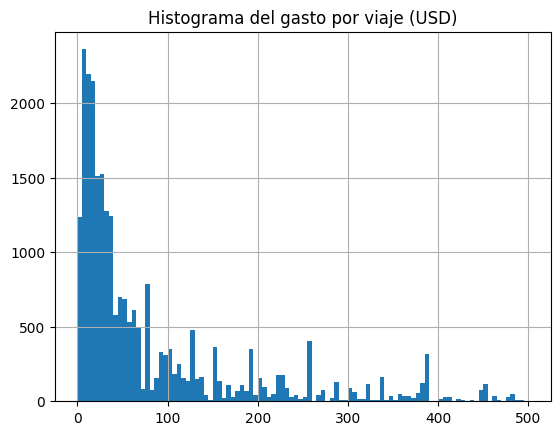

In [ ]:
import matplotlib.pyplot as plt
df2[df2['gasto_usd'] <= 500]['gasto_usd'].hist(bins=100)
plt.title('Histograma del gasto por viaje (USD)')

In [ ]:
if 'tipo_visitante' in df.columns:
  #df['v_gasto_usd_bins'] = binning(df, 'v_gasto_usd', bins= [-1, 15, 30, 60, 200, 3000])
  df2['gasto_usd_agrup'] = binning(df2, 'gasto_usd', bins= [-1,100,15000])
else:
  #df['v_gasto_usd_bins'] = binning(df, 'v_gasto_usd', bins= [-1, 40, 80, 160, 360, 3000])
  df2['gasto_usd_agrup'] = binning(df2, 'gasto_usd', bins= [-1,100,15000])
df2.drop(['gasto_usd'], axis=1, inplace=True) #TO DO descomentar esta parte del codigo,volver a correr todo el notebook y volver a subir el archivo feather generado

In [ ]:
df2.head()

,region_origen,region_destino,tipo_visitante,cantidad_visitantes_agrup,cantidad_noches_agrup,tipo_alojamiento_agrup,medio_transporte,motivo_viaje,quintil_pcf_visitante,nivel_ed_mayoritaria,cond_act_mayoritaria,j_sexo,j_edad,j_nivel_ed,j_cond_act,cant_menores,cant_jovenes,cant_adultos,cant_ancianos,cant_mujeres,cant_varones,cant_actividades_mayoritaria,viaje_familia_completa,promedio_edad_agrup,gasto_usd_agrup
0,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Ocupado,Varón,45 a 59 años,Superior completa o más,Ocupado,0,2 o más,2 o más,0,2,3 o más,0 actividades,Si,"(30, 45]","(100, 15000]"
1,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Inactivo,Mujer,60 años o más,Secundaria completa - superior incompleta,Inactivo,0,0,0,1,1,0,0 actividades,Si,"(70, 100]","(-1, 100]"
2,Cuyo,Cuyo,Excursionista,3 o 4 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Tercer quintil,Hasta primaria incompleta,Menor de 14 años,Varón,30 a 44 años,Superior completa o más,Ocupado,2 o más,1,0,0,0,3 o más,0 actividades,Si,"(0, 30]","(-1, 100]"
3,Cuyo,Provincia de Buenos Aires - Resto,Turista,1 o 2 personas,4 a 7 noches,Hotel o similar hasta 3 estrellas,Omnibus,"Esparcimiento, ocio, recreacion",Quinto quintil,Superior completa o más,Inactivo,Mujer,60 años o más,Superior completa o más,Inactivo,0,1,0,1,2,0,1 o 2 actividades,Si,"(45, 60]","(100, 15000]"
4,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Desocupado,Mujer,60 años o más,Superior completa o más,Inactivo,0,2 o más,0,0,0,2,0 actividades,No,"(0, 30]","(-1, 100]"


In [ ]:
datos={'valores unicos':df2.nunique(),'tipo':df2.dtypes}

df_valores=pd.DataFrame(datos)#.sort_values(by='valores unicos',ascending = False)
print("valores unicos (luego de la fase 3):")
df_valores.reset_index()

valores unicos (luego de la fase 3):


,index,valores unicos,tipo
0,region_origen,8,object
1,region_destino,8,object
2,tipo_visitante,2,object
3,cantidad_visitantes_agrup,3,category
4,cantidad_noches_agrup,6,category
5,tipo_alojamiento_agrup,8,object
6,medio_transporte,4,object
7,motivo_viaje,3,object
8,quintil_pcf_visitante,5,category
9,nivel_ed_mayoritaria,4,category


In [ ]:
df2.shape

(26937, 25)

**Generación del Reporte de Descripción de los Datos**

In [ ]:
for columna in df2.columns:
   numero_columna=df2.columns.get_loc(columna)
   if (numero_columna>=0 and numero_columna<=2) or (numero_columna>=4 and numero_columna<=7) or numero_columna==21 or numero_columna==24 or numero_columna==25:
      df2.rename(columns={columna:'v_'+columna},inplace=True)
   if (numero_columna>=8 and numero_columna<=10) or (numero_columna>=15 and numero_columna<=20) or numero_columna==22 or numero_columna==23 or numero_columna==3:
      df2.rename(columns={columna:'g_'+columna},inplace=True)

In [ ]:
descripciones=[]
categoria=''
for columna in df2.columns:
   prefijo=columna[0]
   if prefijo=='v':
     categoria=' del viaje'
     if columna=='v_motivo_viaje':
       columna='v_motivo'
   elif prefijo=='g':
     categoria=' en el contigente que viaja '
     if columna=='g_quintil_pcf_visitante':
       columna='g_quintil_cada_visitante'
   elif prefijo=='j':
     categoria=' de la jefa o jefe de hogar'
   columna=columna[2:].replace('_',' de ',1)
   columna=columna.replace('_',' ')
   columna=columna+categoria
   descripciones.append(columna)

es_numerico=df2.dtypes=='int64'
tipos=es_numerico.replace({False:'Categórico',True:'Numérico'})

datos={'#':range(1,26),'Atributos':df2.columns,'Tipo':tipos,'Cantidad de valores posibles':df2.nunique(),'Descripción':descripciones}

df_valores=pd.DataFrame(datos)#.sort_values(by='valores unicos',ascending = False)
print("Descripción de atributos")
#df_valores.reset_index()
#df_valores.index.name='Atributo'
#df_valores.reset_index()
#df_valores[['Atributos','Descripción']]
#data_table.DataTable(df_valores, include_index=False, num_rows_per_page=28)
pd.set_option('display.max_rows', 28)
pd.set_option('display.max_columns', None)

display(df_valores)

Descripción de atributos


,#,Atributos,Tipo,Cantidad de valores posibles,Descripción
v_region_origen,1,v_region_origen,Categórico,8,region de origen del viaje
v_region_destino,2,v_region_destino,Categórico,8,region de destino del viaje
v_tipo_visitante,3,v_tipo_visitante,Categórico,2,tipo de visitante del viaje
g_cantidad_visitantes_agrup,4,g_cantidad_visitantes_agrup,Categórico,3,cantidad de visitantes agrup en el contigente ...
v_cantidad_noches_agrup,5,v_cantidad_noches_agrup,Categórico,6,cantidad de noches agrup del viaje
v_tipo_alojamiento_agrup,6,v_tipo_alojamiento_agrup,Categórico,8,tipo de alojamiento agrup del viaje
v_medio_transporte,7,v_medio_transporte,Categórico,4,medio de transporte del viaje
v_motivo_viaje,8,v_motivo_viaje,Categórico,3,motivo del viaje
g_quintil_pcf_visitante,9,g_quintil_pcf_visitante,Categórico,5,quintil de cada visitante en el contigente que...
g_nivel_ed_mayoritaria,10,g_nivel_ed_mayoritaria,Categórico,4,nivel de ed mayoritaria en el contigente que v...


**Generación del Set de Datos luego de la Fase de Preparación**

Se genera el dataset final procesado listo para análisis exploratorio avanzado y modelado.

In [ ]:
df3=df2.copy()
df3.to_csv(f'{BASE_PATH}/dataset_procesado.csv',index=False)
df3=df3.reset_index(drop=True)
df3.to_feather(f'{BASE_PATH}/dataset_procesado.ftr')
df3.head()

,v_region_origen,v_region_destino,v_tipo_visitante,g_cantidad_visitantes_agrup,v_cantidad_noches_agrup,v_tipo_alojamiento_agrup,v_medio_transporte,v_motivo_viaje,g_quintil_pcf_visitante,g_nivel_ed_mayoritaria,g_cond_act_mayoritaria,j_sexo,j_edad,j_nivel_ed,j_cond_act,g_cant_menores,g_cant_jovenes,g_cant_adultos,g_cant_ancianos,g_cant_mujeres,g_cant_varones,v_cant_actividades_mayoritaria,g_viaje_familia_completa,g_promedio_edad_agrup,v_gasto_usd_agrup
0,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Ocupado,Varón,45 a 59 años,Superior completa o más,Ocupado,0,2 o más,2 o más,0,2,3 o más,0 actividades,Si,"(30, 45]","(100, 15000]"
1,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Inactivo,Mujer,60 años o más,Secundaria completa - superior incompleta,Inactivo,0,0,0,1,1,0,0 actividades,Si,"(70, 100]","(-1, 100]"
2,Cuyo,Cuyo,Excursionista,3 o 4 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Tercer quintil,Hasta primaria incompleta,Menor de 14 años,Varón,30 a 44 años,Superior completa o más,Ocupado,2 o más,1,0,0,0,3 o más,0 actividades,Si,"(0, 30]","(-1, 100]"
3,Cuyo,Provincia de Buenos Aires - Resto,Turista,1 o 2 personas,4 a 7 noches,Hotel o similar hasta 3 estrellas,Omnibus,"Esparcimiento, ocio, recreacion",Quinto quintil,Superior completa o más,Inactivo,Mujer,60 años o más,Superior completa o más,Inactivo,0,1,0,1,2,0,1 o 2 actividades,Si,"(45, 60]","(100, 15000]"
4,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Desocupado,Mujer,60 años o más,Superior completa o más,Inactivo,0,2 o más,0,0,0,2,0 actividades,No,"(0, 30]","(-1, 100]"


In [ ]:
dfprueba=pd.read_csv(f'{BASE_PATH}/dataset_procesado.csv')
print(dfprueba.shape)
dfprueba.head()

(26937, 25)


,v_region_origen,v_region_destino,v_tipo_visitante,g_cantidad_visitantes_agrup,v_cantidad_noches_agrup,v_tipo_alojamiento_agrup,v_medio_transporte,v_motivo_viaje,g_quintil_pcf_visitante,g_nivel_ed_mayoritaria,g_cond_act_mayoritaria,j_sexo,j_edad,j_nivel_ed,j_cond_act,g_cant_menores,g_cant_jovenes,g_cant_adultos,g_cant_ancianos,g_cant_mujeres,g_cant_varones,v_cant_actividades_mayoritaria,g_viaje_familia_completa,g_promedio_edad_agrup,v_gasto_usd_agrup
0,Cuyo,Provincia de Buenos Aires - Resto,Turista,5 o más personas,8 a 14 noches,Vivienda de familiares y amigos,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Ocupado,Varón,45 a 59 años,Superior completa o más,Ocupado,0,2 o más,2 o más,0,2,3 o más,0 actividades,Si,"(30, 45]","(100, 15000]"
1,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Inactivo,Mujer,60 años o más,Secundaria completa - superior incompleta,Inactivo,0,0,0,1,1,0,0 actividades,Si,"(70, 100]","(-1, 100]"
2,Cuyo,Cuyo,Excursionista,3 o 4 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Tercer quintil,Hasta primaria incompleta,Menor de 14 años,Varón,30 a 44 años,Superior completa o más,Ocupado,2 o más,1,0,0,0,3 o más,0 actividades,Si,"(0, 30]","(-1, 100]"
3,Cuyo,Provincia de Buenos Aires - Resto,Turista,1 o 2 personas,4 a 7 noches,Hotel o similar hasta 3 estrellas,Omnibus,"Esparcimiento, ocio, recreacion",Quinto quintil,Superior completa o más,Inactivo,Mujer,60 años o más,Superior completa o más,Inactivo,0,1,0,1,2,0,1 o 2 actividades,Si,"(45, 60]","(100, 15000]"
4,Cuyo,Cuyo,Excursionista,1 o 2 personas,0 noches,No usó,Automóvil o similar (propio),"Esparcimiento, ocio, recreacion",Quinto quintil,Secundaria completa - superior incompleta,Desocupado,Mujer,60 años o más,Superior completa o más,Inactivo,0,2 o más,0,0,0,2,0 actividades,No,"(0, 30]","(-1, 100]"
